In [1]:
suppressMessages(library(Seurat))
suppressMessages(library(ggplot2))
suppressMessages(library(patchwork))
suppressMessages(library(SeuratObject))
suppressMessages(library(dplyr))
suppressMessages(library(viridis))
suppressMessages(library(UCell))

In [2]:
df_markers <- read.csv("../../results/05_fibroblast/19_find_marker/markers.csv")

In [3]:
head(df_markers)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,0,2.085640,0.823,0.363,0,Fib1,WISP2
2,0,1.913916,0.737,0.298,0,Fib1,SCARA5
3,0,1.967593,0.839,0.408,0,Fib1,MFAP5
4,0,2.270556,0.619,0.196,0,Fib1,CLEC3B
5,0,2.001502,0.663,0.264,0,Fib1,PI16
6,0,2.410789,0.618,0.221,0,Fib1,CD55


In [4]:
out_dir <- "../../results/05_fibroblast/20_cell_state_score"

if(!dir.exists(out_dir)){
    dir.create(out_dir, recursive = TRUE)
}

In [5]:
sample_list <- c('HC01', 'HC02', 'HC03', 'HC05',
                 'SSc4994', 
                 'SSc5380', 
               'SSc-HL01', 'SSc-HL05', 'SSc-HL06', 'SSc-HL11',
               'SSc-HL13', 'SSc-HL25', 'SSc-HL33', 'SSc-HL35')

In [6]:
for(sample in sample_list){
    obj <- readRDS(glue::glue("../../results/04_spatial/01_read_data/{sample}.rds"))
    obj <- NormalizeData(obj)
    
    df <- read.csv(glue::glue('../../results/04_spatial/09_run_cell2location/{sample}.csv'), row.names = 1)
    obj <- AddMetaData(obj, metadata = df) 

    # only keep genes that are found in spatial dta
    gene.use <- intersect(rownames(obj), df_markers$gene)
    
    df_markers_subset <- df_markers %>%
        subset(gene %in%gene.use) %>%
        dplyr::group_by(cluster) %>%
        slice_min(n = 10, order_by = p_val_adj, with_ties = FALSE) %>%
        subset(select = c("gene", "cluster"))  
    
   # convert dataframe to list for module score calculation
    all.markers <- split(df_markers_subset, 
                         df_markers_subset$cluster)

    for(cl in names(all.markers)){
        all.markers[[cl]] <- all.markers[[cl]]$gene 
    }
    
    obj <- AddModuleScore_UCell(obj, features = all.markers)
    
    df_module_score <- as.data.frame(obj@meta.data)%>%
        select(., contains("UCell"))

    colnames(df_module_score) <- names(all.markers)
    obj <- AddMetaData(obj, metadata = df_module_score)
    
    write.csv(df_module_score, glue::glue("{out_dir}/{sample}_score.csv"))
    saveRDS(obj, glue::glue("{out_dir}/{sample}.rds"))

}

Normalizing layer: counts

Normalizing layer: counts

Normalizing layer: counts

Normalizing layer: counts

Normalizing layer: counts

Normalizing layer: counts

Normalizing layer: counts

Normalizing layer: counts

Normalizing layer: counts

Normalizing layer: counts

Normalizing layer: counts

Normalizing layer: counts

Normalizing layer: counts

Normalizing layer: counts



In [7]:
celltypes <- names(all.markers)

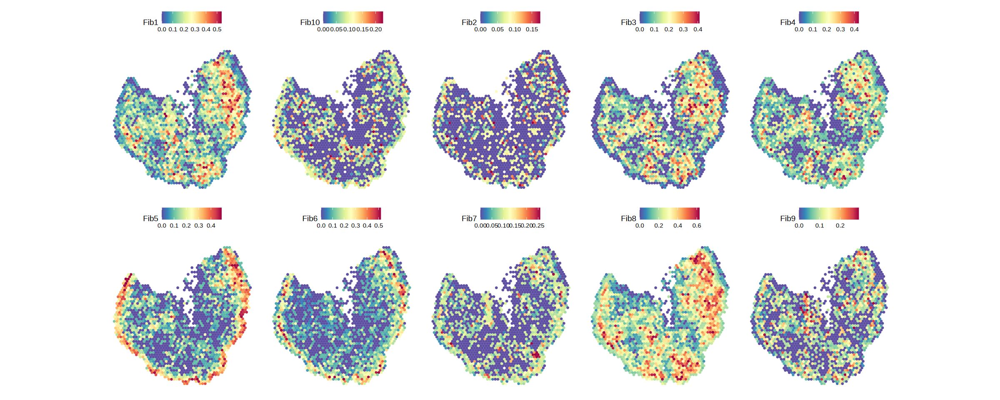

In [8]:
options(repr.plot.height = 8, repr.plot.width = 20)

obj <- readRDS(glue::glue("{out_dir}/HC01.rds"))

SpatialFeaturePlot(obj, features = celltypes, combine = TRUE, 
                   ncol = 5, image.alpha = 0,
                   max.cutoff = "q99", pt.size.factor = 1.8)

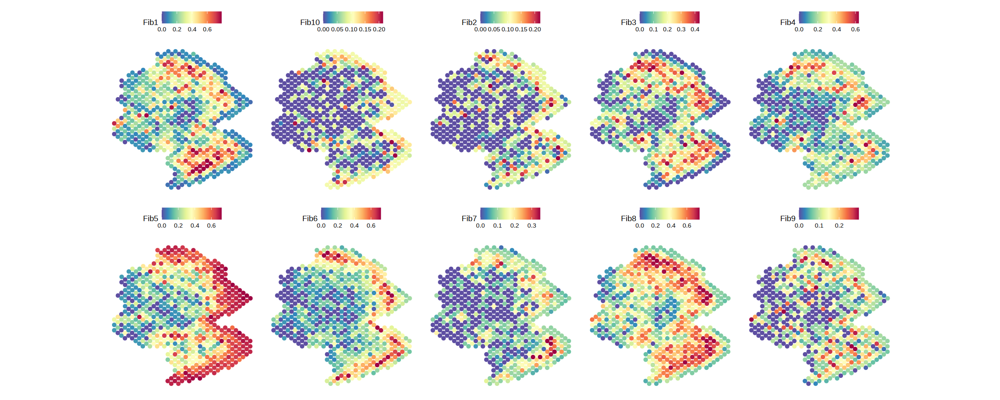

In [9]:
options(repr.plot.height = 8, repr.plot.width = 20)

obj <- readRDS(glue::glue("{out_dir}/HC02.rds"))

SpatialFeaturePlot(obj, features = celltypes, combine = TRUE, 
                   ncol = 5, image.alpha = 0,
                   max.cutoff = "q99", pt.size.factor = 9)

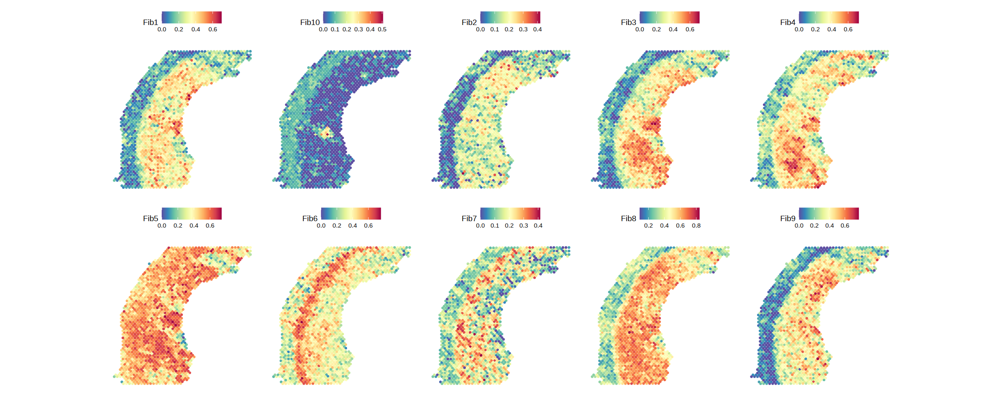

In [10]:
options(repr.plot.height = 8, repr.plot.width = 20)

obj <- readRDS(glue::glue("{out_dir}/HC03.rds"))

SpatialFeaturePlot(obj, features = celltypes, combine = TRUE, 
                   ncol = 5, image.alpha = 0,
                   pt.size.factor = 12.5)

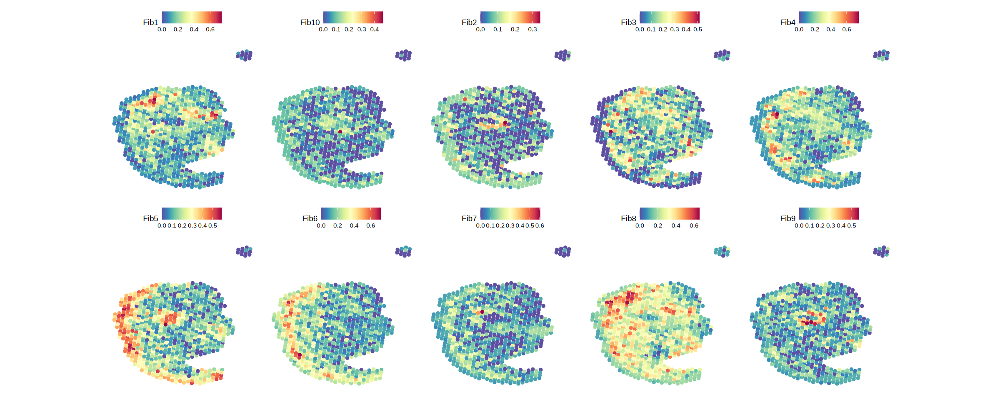

In [11]:
options(repr.plot.height = 8, repr.plot.width = 20)

obj <- readRDS(glue::glue("{out_dir}/HC05.rds"))

SpatialFeaturePlot(obj, features = celltypes, combine = TRUE, 
                   ncol = 5, image.alpha = 0, pt.size.factor = 18)

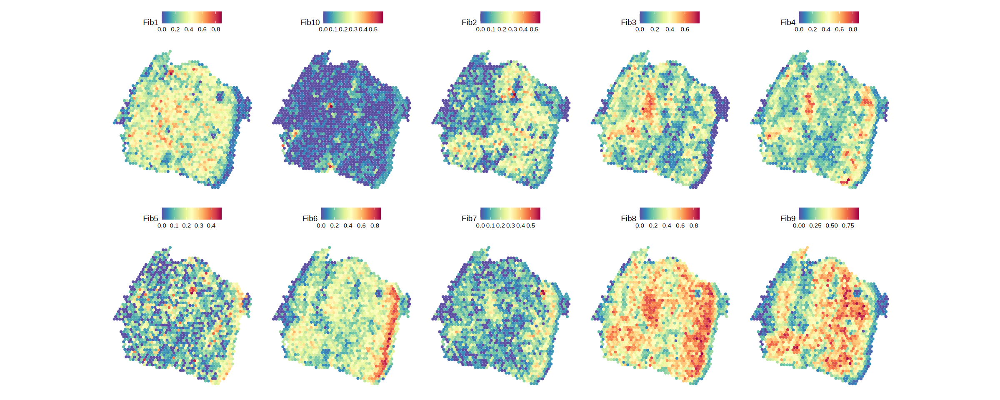

In [12]:
options(repr.plot.height = 8, repr.plot.width = 20)

obj <- readRDS(glue::glue("{out_dir}/SSc4994.rds"))

SpatialFeaturePlot(obj, features = celltypes, combine = TRUE, 
                   ncol = 5, image.alpha = 0, pt.size.factor = 5)

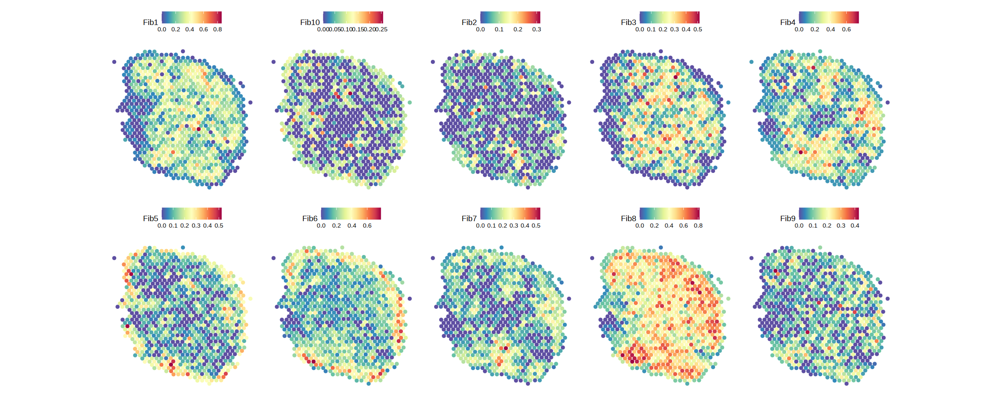

In [13]:
options(repr.plot.height = 8, repr.plot.width = 20)

obj <- readRDS(glue::glue("{out_dir}/SSc5380.rds"))

SpatialFeaturePlot(obj, features = celltypes, combine = TRUE, 
                   ncol = 5, image.alpha = 0, pt.size.factor = 2)

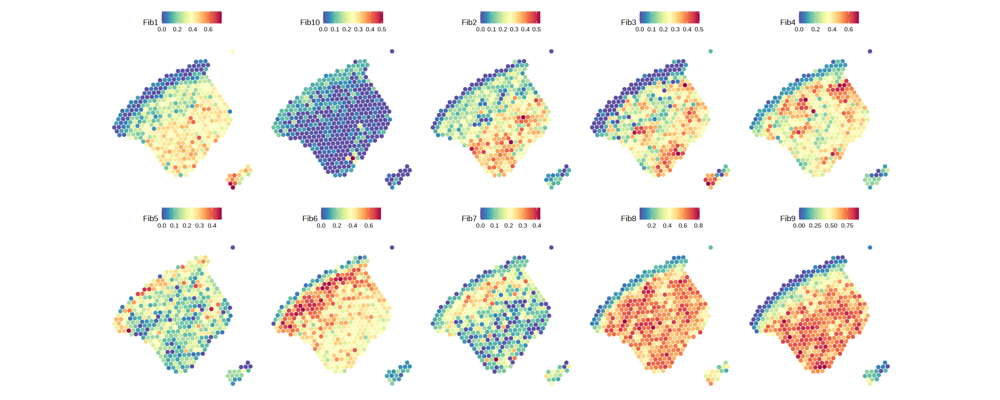

In [14]:
options(repr.plot.height = 8, repr.plot.width = 20)

obj <- readRDS(glue::glue("{out_dir}/SSc-HL01.rds"))

SpatialFeaturePlot(obj, features = celltypes, combine = TRUE, 
                   ncol = 5, image.alpha = 0, pt.size.factor = 18)

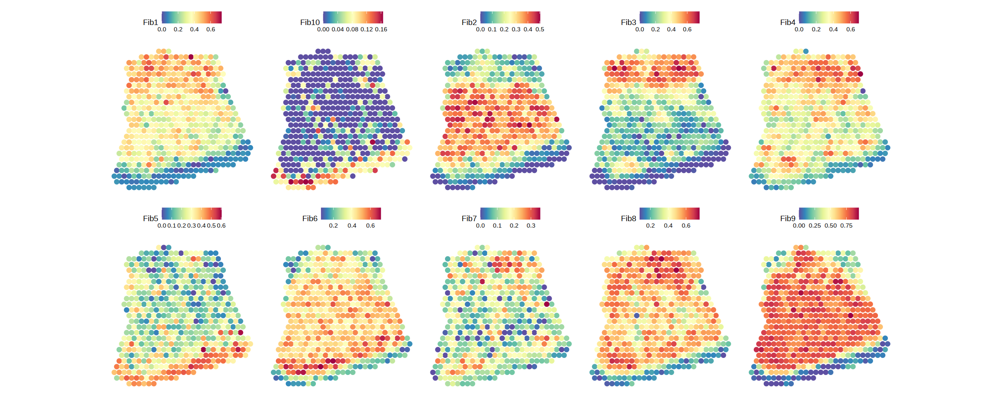

In [15]:
options(repr.plot.height = 8, repr.plot.width = 20)

obj <- readRDS(glue::glue("{out_dir}/SSc-HL05.rds"))

SpatialFeaturePlot(obj, features = celltypes, combine = TRUE, 
                   ncol = 5, image.alpha = 0, pt.size.factor = 5)

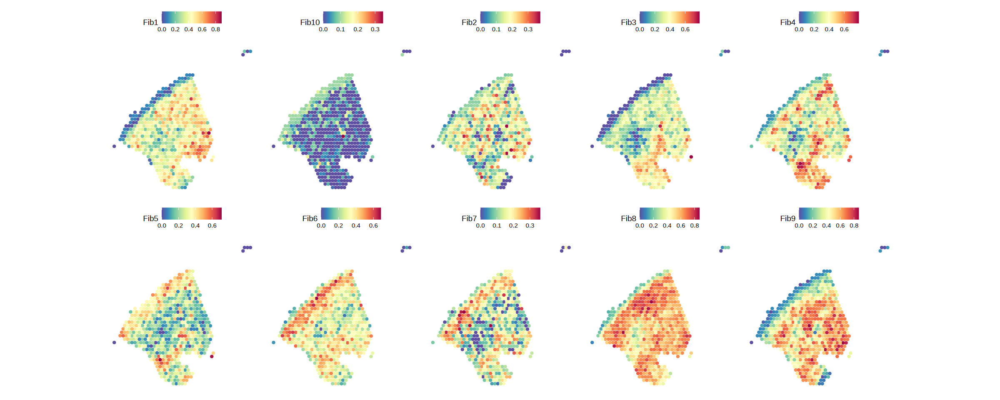

In [16]:
options(repr.plot.height = 8, repr.plot.width = 20)

obj <- readRDS(glue::glue("{out_dir}/SSc-HL06.rds"))

SpatialFeaturePlot(obj, features = celltypes, combine = TRUE, 
                   ncol = 5, image.alpha = 0, pt.size.factor = 13)

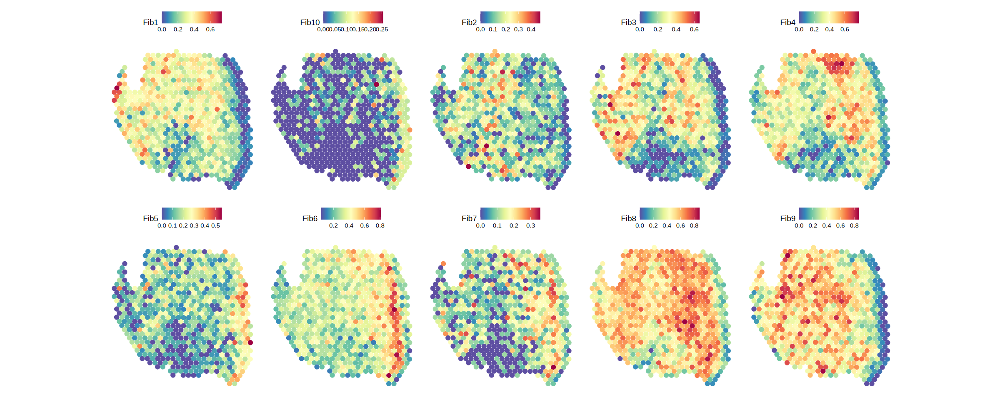

In [17]:
options(repr.plot.height = 8, repr.plot.width = 20)

obj <- readRDS(glue::glue("{out_dir}/SSc-HL11.rds"))

SpatialFeaturePlot(obj, features = celltypes, combine = TRUE, 
                   ncol = 5, image.alpha = 0, pt.size.factor = 10.5)

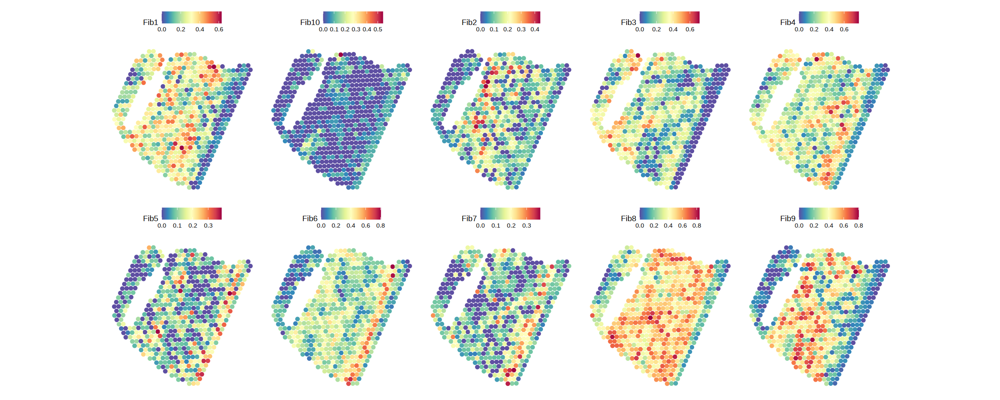

In [18]:
options(repr.plot.height = 8, repr.plot.width = 20)

obj <- readRDS(glue::glue("{out_dir}/SSc-HL13.rds"))

SpatialFeaturePlot(obj, features = celltypes, combine = TRUE, 
                   ncol = 5, image.alpha = 0, pt.size.factor = 20)

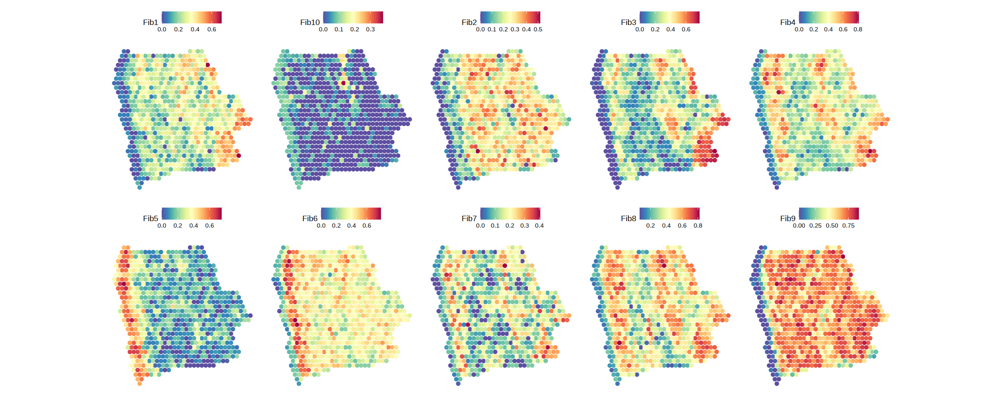

In [19]:
options(repr.plot.height = 8, repr.plot.width = 20)

obj <- readRDS(glue::glue("{out_dir}/SSc-HL25.rds"))

SpatialFeaturePlot(obj, features = celltypes, combine = TRUE, 
                   ncol = 5, image.alpha = 0, pt.size.factor = 18)

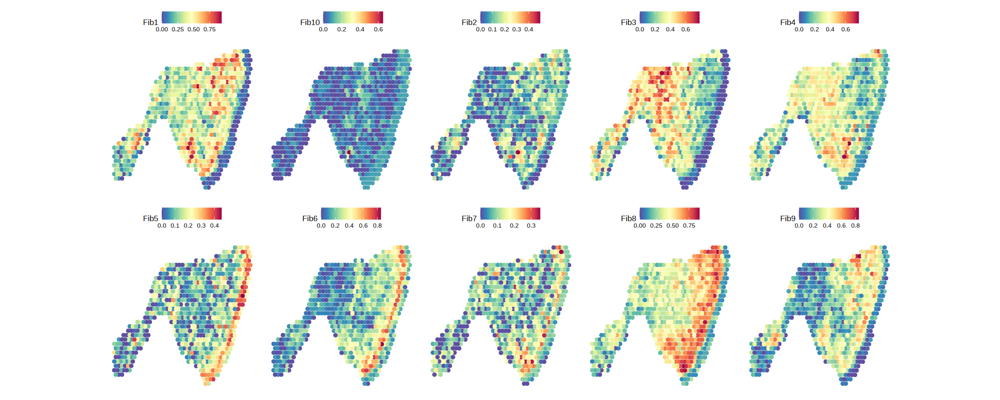

In [20]:
options(repr.plot.height = 8, repr.plot.width = 20)

obj <- readRDS(glue::glue("{out_dir}/SSc-HL33.rds"))

SpatialFeaturePlot(obj, features = celltypes, combine = TRUE, 
                   ncol = 5, image.alpha = 0, pt.size.factor = 9.5)

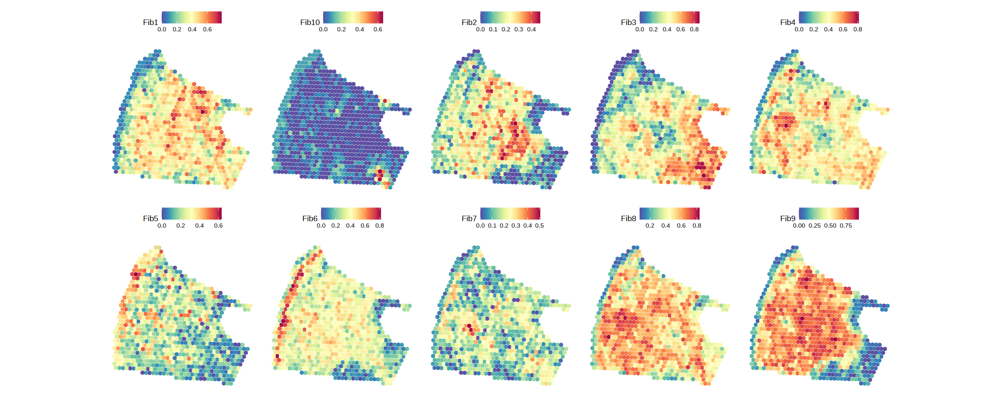

In [21]:
options(repr.plot.height = 8, repr.plot.width = 20)

obj <- readRDS(glue::glue("{out_dir}/SSc-HL35.rds"))

SpatialFeaturePlot(obj, features = celltypes, combine = TRUE, 
                   ncol = 5, image.alpha = 0, pt.size.factor = 10)